<center><h1>Jayaram_ChaitanyaPriya_HW6</h1></center>
<br>
<br>

Name: Chaitanya Priya Jayaram
<br>
Github Username: chaitanya-priya-kj
<br>
USC ID: 9525343278
<br> **Using two of the late days for this assignments**


# 1. Tree-Based Methods

In [1]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score
from tabulate import tabulate
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.svm import SVC

## a) Download the APS Failure data

In [45]:
test_path = '../data/aps_failure_test_set.csv'
train_path = '../data/aps_failure_training_set.csv'

In [46]:
df_train = pd.read_csv(train_path, skiprows=20,na_values='na')
df_test = pd.read_csv(test_path, skiprows=20,na_values='na')

In [47]:
df_train

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,neg,33058,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,neg,41040,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,neg,12,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,neg,60874,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,NaN,6.640000e+02,186.0,0.0,0.0,0.0,0.0,0.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,neg,2286,NaN,2.130707e+09,224.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,neg,112,0.0,2.130706e+09,18.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,neg,80292,NaN,2.130706e+09,494.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


## b) Data Preparation

### i. Research what types of techniques are usually used for dealing with data with missing values. Pick at least one of them and apply it to this data in the next steps.

Different data imputation methods that are used are:
* Filling in with mean, median or mode (most frequently occuring value)<br>
* Using k-nearest neighbors 
* Imputation Using Multivariate Imputation by Chained Equation (MICE)
* Filling in with maximum or minimum value 
* Hot deck and cold deck imputation methods 


Since all of the features we have are numeric, the method we'll be using to fill in the missing values is mean.

Splitting the dataset to features and target

In [48]:
X_train = df_train.iloc[:, 1:]
X_test = df_test.iloc[:, 1:]
y_train = df_train.iloc[:,:1]
y_test = df_test.iloc[:,:1]

In [49]:
X_train

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,153002,NaN,6.640000e+02,186.0,0.0,0.0,0.0,0.0,0.0,2564.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,2286,NaN,2.130707e+09,224.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,112,0.0,2.130706e+09,18.0,0.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,80292,NaN,2.130706e+09,494.0,0.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [50]:
X_train = X_train.replace(np.NaN, X_train.select_dtypes(include=np.number).mean())
X_test = X_test.replace(np.NaN,X_test.select_dtypes(include=np.number).mean())

### ii. For each of the 170 features, calculate the coefficient of variation CV = m/s , where s is sample standard deviation and m is sample mean.

In [51]:
def calc_cv(df):
    cv_list = []
    for c in df.columns:
        cv = df[c].std() / df[c].mean()
        cv_list.append(cv)
    df_cv = pd.DataFrame({'col_name': df.columns, 'cv': cv_list})
    return(df_cv)

In [52]:
X_train_cv = calc_cv(X_train)
X_train_cv

,col_name,cv
0,aa_000,2.450938
1,ab_000,2.328400
2,ac_000,2.169767
3,ad_000,183.847620
4,ae_000,23.190937
...,...,...
165,ee_007,4.962483
166,ee_008,3.222010
167,ee_009,5.626979
168,ef_000,47.124953


### iii. Plot a correlation matrix for your features using pandas or any other tool.

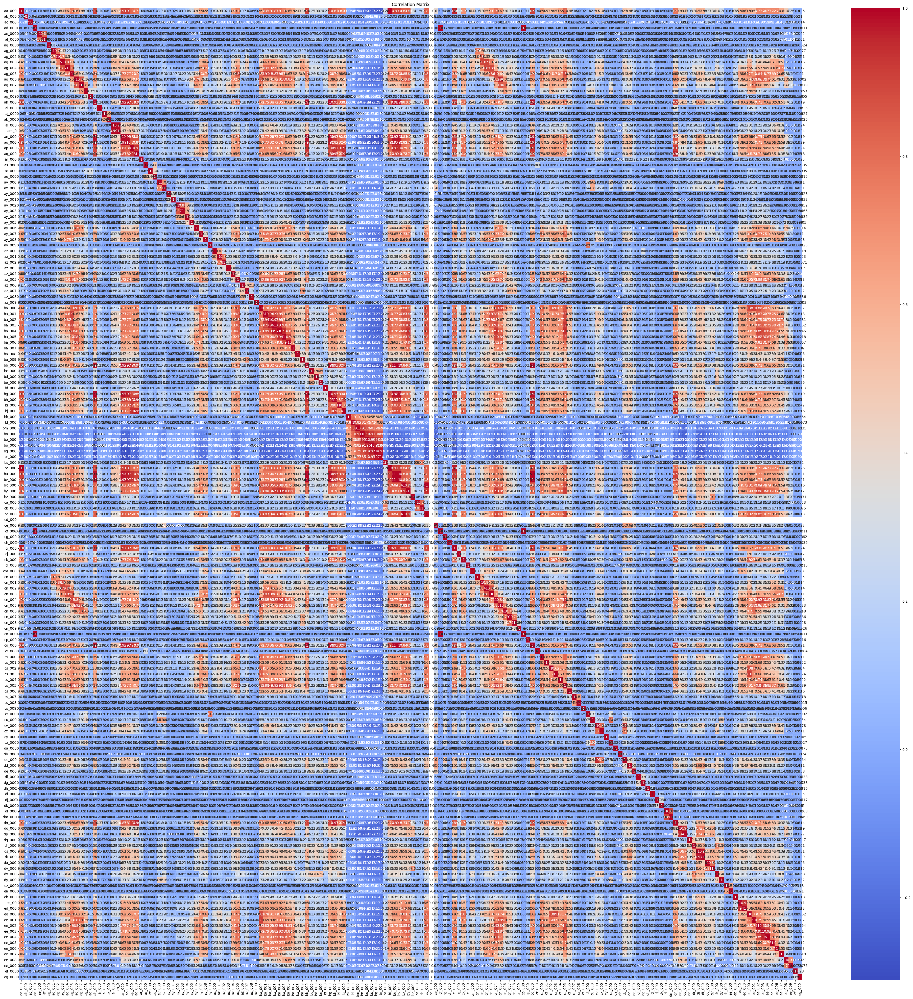

In [10]:
correlation_matrix = X_train.corr()

plt.figure(figsize=(50, 50))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

### iv. Pick √⌊ 170⌋ features with highest CV , and make scatter plots and box plots for them, similar to those on p. 129 of ISLR. Can you draw conclusions about significance of those features, just by the scatter plots? This does not mean that you will only use those features in the following questions. We picked them only for visualization.

In [53]:
b = math.floor(np.sqrt(170))

top_features = X_train_cv.nlargest(b, 'cv')
top_features[['col_name', 'cv']]
top_features

,col_name,cv
122,cs_009,235.277605
91,cf_000,184.233092
109,co_000,183.949017
3,ad_000,183.847620
136,dh_000,114.984991
138,dj_000,109.647285
6,ag_000,91.878565
27,as_000,86.416904
41,ay_009,83.786063
51,az_009,76.967978


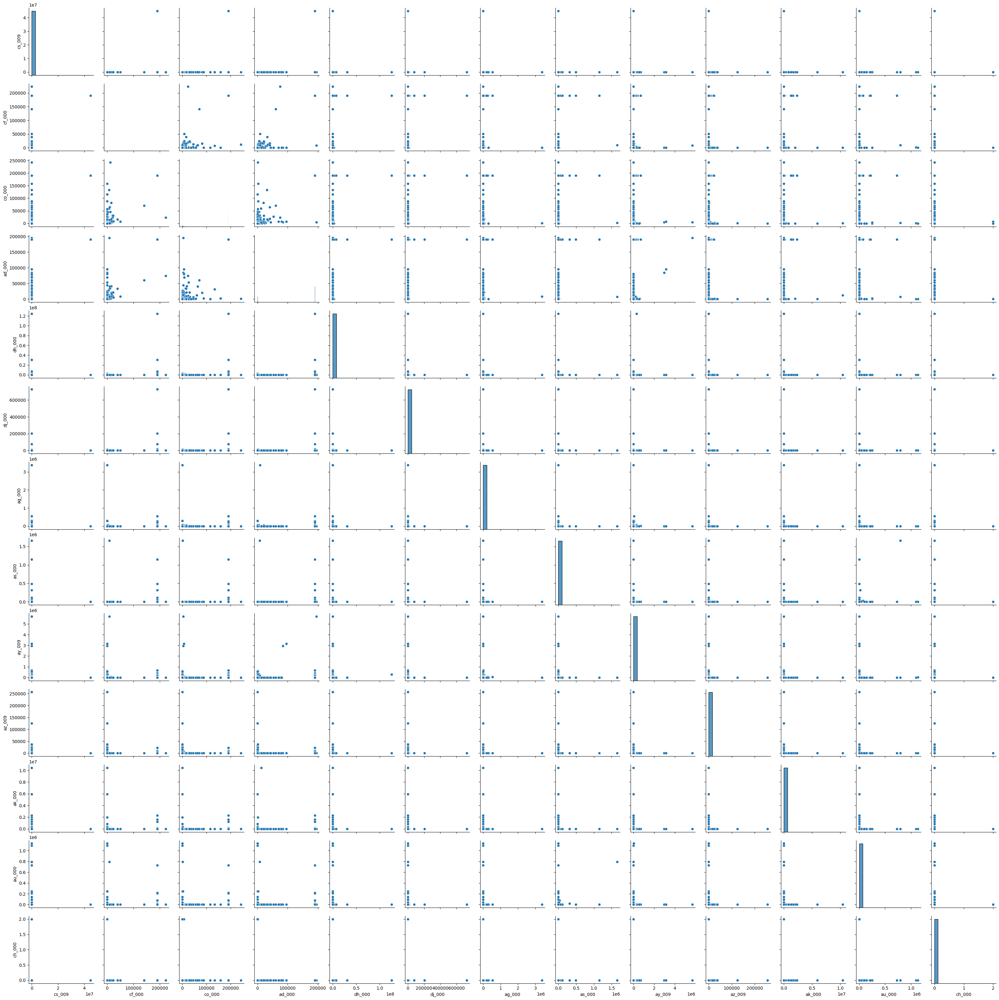

In [13]:
sns.pairplot(X_train[top_features.col_name])
plt.show()

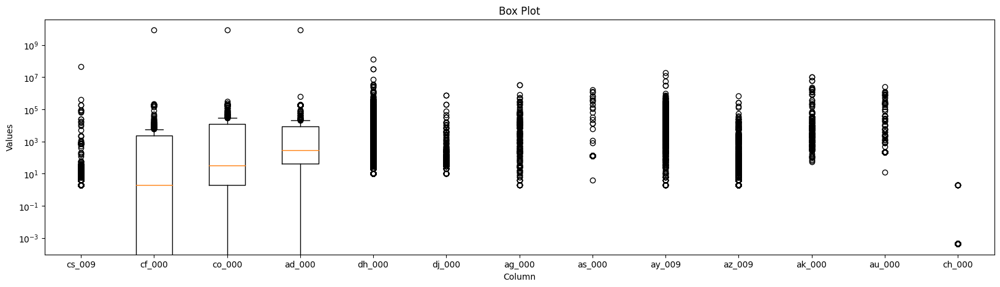

In [54]:
column_data = X_train[top_features.col_name]

plt.figure(figsize=(20, 5))
plt.boxplot(column_data)

plt.title('Box Plot')
plt.xlabel('Column')
plt.ylabel('Values')
plt.yscale('log')
plt.xticks(range(1, len(top_features.col_name) + 1), top_features.col_name)

plt.show()

From the scatter plots we can observe that there exists no correlation between some of the features and also since the null values are replaced by mean, it results in potentially making relationships between variables appear more linear or less scattered if there exists a relationship that can be deduced by the scatter plot. Therefore, only a scatter plot cannot determine the significance of these features. 

### v. Determine the number of positive and negative data. Is this data set imbalanced?

In [55]:
print("Number of positive and negative data in the training set", y_train.value_counts())

Number of positive and negative data in the training set class
neg      59000
pos       1000
dtype: int64


In [56]:
print("Number of positive and negative data in the test set", y_test.value_counts())

Number of positive and negative data in the test set class
neg      15625
pos        375
dtype: int64


In [57]:
print("Number of positive and negative data in the whole dataset", pd.concat([y_test, y_train], axis=0).value_counts())

Number of positive and negative data in the whole dataset class
neg      74625
pos       1375
dtype: int64


It can be observed that the classes are imbalanced with neg:pos with ratio 597:11 in the whole dataset. 

## (c) Train a random forest to classify the data set. Do NOT compensate for class imbalance in the data set. Calculate the confusion matrix, ROC, AUC, and misclassification for training and test sets and report them (You may use pROC package). Calculate Out of Bag error estimate for your random forest and compare it to the test error.

In [58]:
error_dict = {}
clf = RandomForestClassifier(max_depth=5, random_state=42,oob_score=True)
clf.fit(X_train, np.ravel(y_train))

RandomForestClassifier(max_depth=5, oob_score=True, random_state=42)

In [59]:
print(f"Model score for training data: {clf.score(X_train, y_train)}\n")

print(f"Out of bag error for the classifier: {round(1 - clf.oob_score_,4)}\n")

y_pred = clf.predict(X_train)
c_matrix = metrics.confusion_matrix(y_train, y_pred)

print('confusion matrix for training data \n', c_matrix)



Model score for training data: 0.9924

Out of bag error for the classifier: 0.0093

confusion matrix for training data 
 [[58976    24]
 [  432   568]]


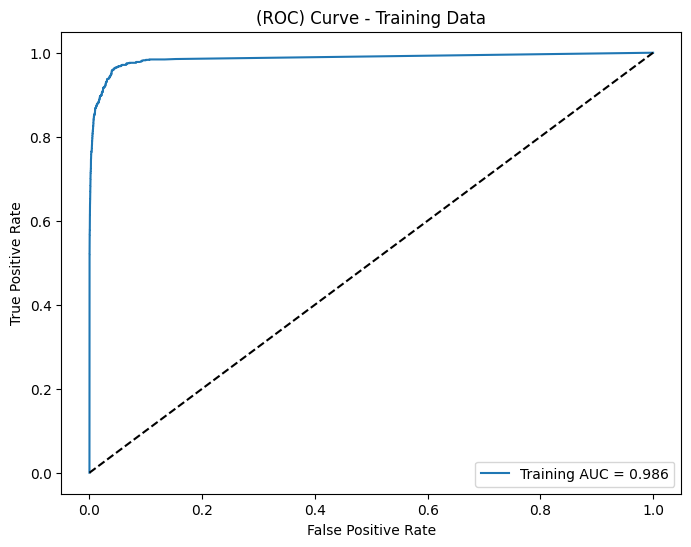

In [21]:
y_train_pred_proba = clf.predict_proba(X_train)[:, 1]  
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_proba,pos_label='pos')

auc_train = roc_auc_score(y_train, y_train_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Training AUC = {auc_train:.3f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('(ROC) Curve - Training Data')
plt.legend(loc='lower right')
plt.show()

In [22]:
print(f"Model score for testing data: {clf.score(X_test,y_test)}\n")
print(f"Test error: {round(1-clf.score(X_test,y_test),4)}\n")
y_pred = clf.predict(X_test)
c_matrix = metrics.confusion_matrix(y_test, y_pred)
print('confusion matrix for testing data \n', c_matrix)

Model score for testing data: 0.9884375

Test error: 0.0116

confusion matrix for testing data 
 [[15612    13]
 [  172   203]]


In [23]:
error_dict['imbalanced dataset'] = {
    'Test Error': 1 - clf.score(X_test,y_test),
    'Train Error': 1 - clf.score(X_train, y_train),
    'OOB Error':round(1 - clf.oob_score_,4)
}

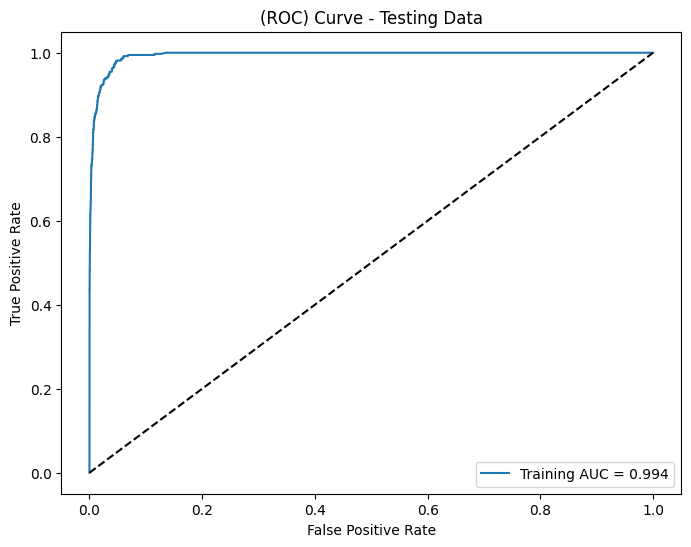

In [24]:
y_test_pred_proba = clf.predict_proba(X_test)[:, 1]  
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba,pos_label='pos')

auc_train = roc_auc_score(y_test, y_test_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr_test, tpr_test, label=f'Training AUC = {auc_train:.3f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('(ROC) Curve - Testing Data')
plt.legend(loc='lower right')
plt.show()

The test error for the classifier is 0.0116 when compared to the out of bag error estimate to be 0.0093. The test error is comaparitively greater than oob error estimate. 

## (d) Research how class imbalance is addressed in random forests. Compensate for class imbalance in your random forest and repeat 1c. Compare the results with those of 1c.


Different ways to handle class imbalance when using Random Forest: 
* Using the class weight parameter in scikit-learn's Random Forest implementation.
* Undersampling which involves removing the samples from the majority class to balance the dataset. 
* Oversampling which involves creating new examples to the minority class.
* Using Balanced Random Forest combine multiple classifiers to improve performance on imbalanced datasets.

#### Using the class weight parameter in scikit-learn's Random Forest implementation.

In [25]:
clf_balanced = RandomForestClassifier(max_depth=5, random_state=42,oob_score=True,class_weight = 'balanced')
clf_balanced.fit(X_train, np.ravel(y_train))
print(f"Model score for training data: {clf_balanced.score(X_train, y_train)}\n")

print(f"Out of bag error for the classifier: {round(1 - clf_balanced.oob_score_,4)}\n")

y_pred = clf_balanced.predict(X_train)
c_matrix = metrics.confusion_matrix(y_train, y_pred)
print('confusion matrix for training data \n', c_matrix)

Model score for training data: 0.95965

Out of bag error for the classifier: 0.0416

confusion matrix for training data 
 [[56610  2390]
 [   31   969]]


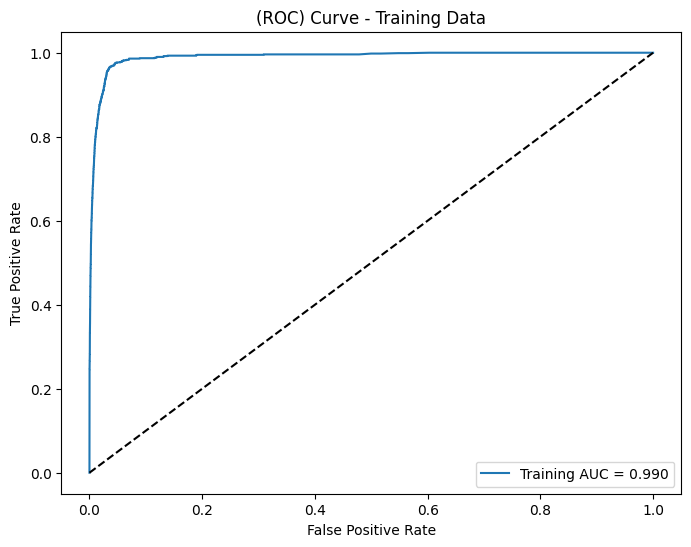

In [26]:
y_train_pred_proba = clf_balanced.predict_proba(X_train)[:, 1]  
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_proba,pos_label='pos')

auc_train = roc_auc_score(y_train, y_train_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Training AUC = {auc_train:.3f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('(ROC) Curve - Training Data')
plt.legend(loc='lower right')
plt.show()

Model score for testing data: 0.9610625

Test error: 0.0389

confusion matrix for testing data 
 [[15014   611]
 [   12   363]]


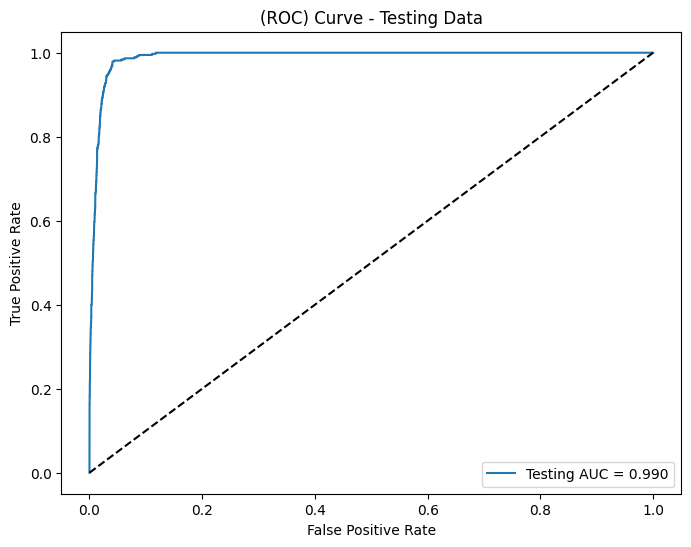

In [27]:
print(f"Model score for testing data: {clf_balanced.score(X_test,y_test)}\n")
print(f"Test error: {round(1-clf_balanced.score(X_test,y_test),4)}\n")
y_pred = clf_balanced.predict(X_test)
c_matrix = metrics.confusion_matrix(y_test, y_pred)
print('confusion matrix for testing data \n', c_matrix)

y_test_pred_proba = clf_balanced.predict_proba(X_test)[:, 1]  
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba,pos_label='pos')

auc_train = roc_auc_score(y_test, y_test_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr_test, tpr_test, label=f'Testing AUC = {auc_train:.3f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('(ROC) Curve - Testing Data')
plt.legend(loc='lower right')
plt.show()

In [28]:
error_dict['balanced dataset'] = {
    'Test Error': 1 - clf_balanced.score(X_test,y_test),
    'Train Error': 1 - clf_balanced.score(X_train, y_train),
    'OOB Error':round(1 - clf_balanced.oob_score_,4)
}

In [29]:
data = [[k] + list(v.values()) for k, v in error_dict.items()]
headers = ['Dataset'] + list(next(iter(error_dict.values())).keys())
table = tabulate(data, headers, tablefmt='grid')
print(table)

+--------------------+--------------+---------------+-------------+
| Dataset            |   Test Error |   Train Error |   OOB Error |
+====================+==============+===============+=============+
| imbalanced dataset |    0.0115625 |       0.0076  |      0.0093 |
+--------------------+--------------+---------------+-------------+
| balanced dataset   |    0.0389375 |       0.04035 |      0.0416 |
+--------------------+--------------+---------------+-------------+


Comparing the results, we can observe that the imbalanced dataset achieves lower error rates across all three metrics (test error, train error, and OOB error) compared to the balanced dataset. This suggests that the classifier performs better on the imbalanced dataset, potentially due to the larger number of samples in the majority class, which provides more information for the model to learn from.

## (e) XGBoost and Model Trees

In [61]:
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.fit_transform(y_test)

param_grid = {
    'reg_alpha': [0.01, 0.02, 0.09, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]
}

clf_xgboost = XGBClassifier(objective='binary:logistic')

grid_search = GridSearchCV(clf_xgboost, param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_alpha = grid_search.best_params_['reg_alpha']

/Users/chaitanyapriyakj/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/chaitanyapriyakj/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [62]:
best_alpha

0.2

Using the best alpha found using 5 fold cross validation

In [63]:
clf_xgboost_best = XGBClassifier(objective='binary:logistic',reg_alpha=best_alpha)
clf_xgboost_best = clf_xgboost_best.fit(X_train, y_train)

print(f"Model score for training data: {clf_xgboost_best.score(X_train, y_train)}\n")


y_pred = clf_xgboost_best.predict(X_train)
c_matrix = metrics.confusion_matrix(y_train, y_pred)
print('confusion matrix for training data \n', c_matrix)

Model score for training data: 0.9999833333333333

confusion matrix for training data 
 [[59000     0]
 [    1   999]]


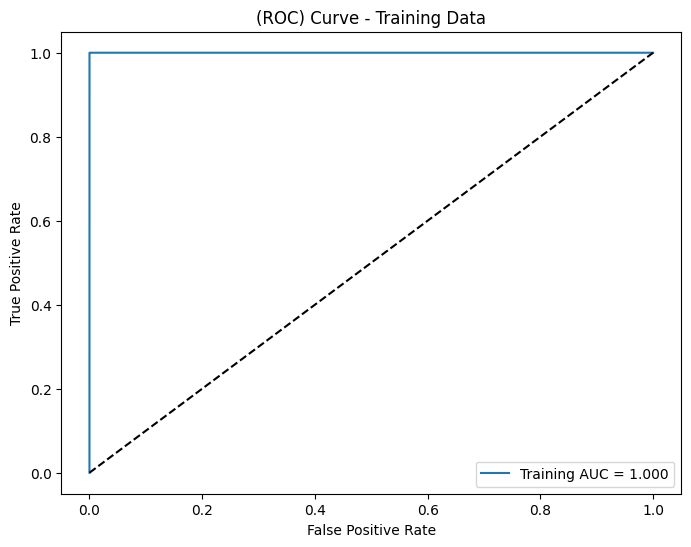

In [64]:
y_train_pred_proba = clf_xgboost_best.predict_proba(X_train)[:, 1]  
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_proba)

auc_train = roc_auc_score(y_train, y_train_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Training AUC = {auc_train:.3f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('(ROC) Curve - Training Data')
plt.legend(loc='lower right')
plt.show()

Model score for testing data: 0.994125

Test error: 0.0059

confusion matrix for testing data 
 [[15608    17]
 [   77   298]]


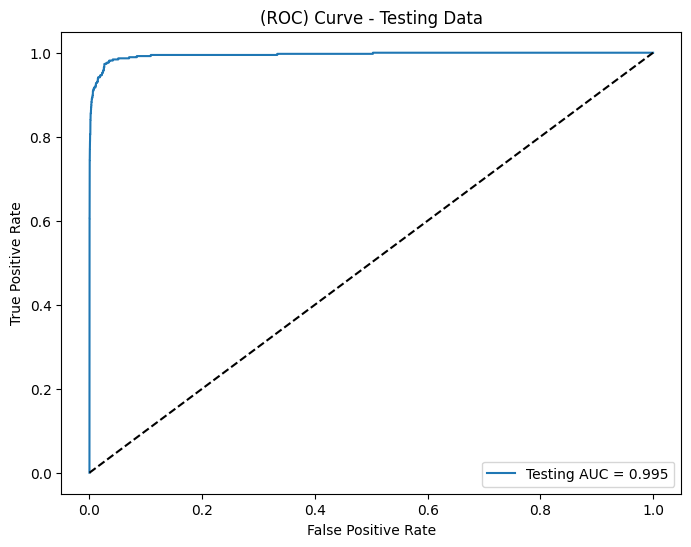

In [41]:
print(f"Model score for testing data: {clf_xgboost_best.score(X_test,y_test)}\n")
print(f"Test error: {round(1-clf_xgboost_best.score(X_test,y_test),4)}\n")
y_pred = clf_xgboost_best.predict(X_test)
c_matrix = metrics.confusion_matrix(y_test, y_pred)
print('confusion matrix for testing data \n', c_matrix)

y_test_pred_proba = clf_xgboost_best.predict_proba(X_test)[:, 1]  
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba)

auc_train = roc_auc_score(y_test, y_test_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr_test, tpr_test, label=f'Testing AUC = {auc_train:.3f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('(ROC) Curve - Testing Data')
plt.legend(loc='lower right')
plt.show()

## f) Use SMOTE (Synthetic Minority Over-sampling Technique) to pre-process your data to compensate for class imbalance.4 Train XGBosst with L1-penalized logistic regression at each node using the pre-processed data and repeat 1e. Do not forget that there is a right and a wrong way of cross validation here. Compare the uncompensated case with SMOTE case.


In [65]:
oversample = SMOTE()
X_train_smote, y_train_smote = oversample.fit_resample(X_train, y_train)

In [69]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_train_smote_encoded = label_encoder.fit_transform(y_train_smote)
y_test_encoded = label_encoder.transform(y_test)

param_grid = {
    'reg_alpha': [0.01, 0.02, 0.09, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]
}

clf_xgboost_smote = XGBClassifier(objective='binary:logistic')

grid_search_smote = GridSearchCV(clf_xgboost_smote, param_grid, cv=5)
grid_search_smote.fit(X_train_smote, y_train_smote_encoded)

best_alpha = grid_search_smote.best_params_['reg_alpha']


In [70]:
best_alpha

0.09

In [71]:
clf_xgboost_best = XGBClassifier(objective='binary:logistic',reg_alpha=best_alpha)
clf_xgboost_best = clf_xgboost_best.fit(X_train_smote, y_train_smote_encoded)

print(f"Model score for training data: {clf_xgboost_best.score(X_train_smote, y_train_smote_encoded)}\n")


y_pred = clf_xgboost_best.predict(X_train_smote)
c_matrix = metrics.confusion_matrix(y_train_smote_encoded, y_pred)
print('confusion matrix for training data \n', c_matrix)

Model score for training data: 0.9999915254237288

confusion matrix for training data 
 [[59000     0]
 [    1 58999]]


In [72]:
clf_xgboost_best = XGBClassifier(objective='binary:logistic',reg_alpha=0.2)
clf_xgboost_best = clf_xgboost_best.fit(X_train_smote, y_train_smote_encoded)

print(f"Model score for training data: {clf_xgboost_best.score(X_train_smote, y_train_smote_encoded)}\n")


y_pred = clf_xgboost_best.predict(X_train_smote)
c_matrix = metrics.confusion_matrix(y_train_smote_encoded, y_pred)
print('confusion matrix for training data \n', c_matrix)

Model score for training data: 0.9999915254237288

confusion matrix for training data 
 [[59000     0]
 [    1 58999]]


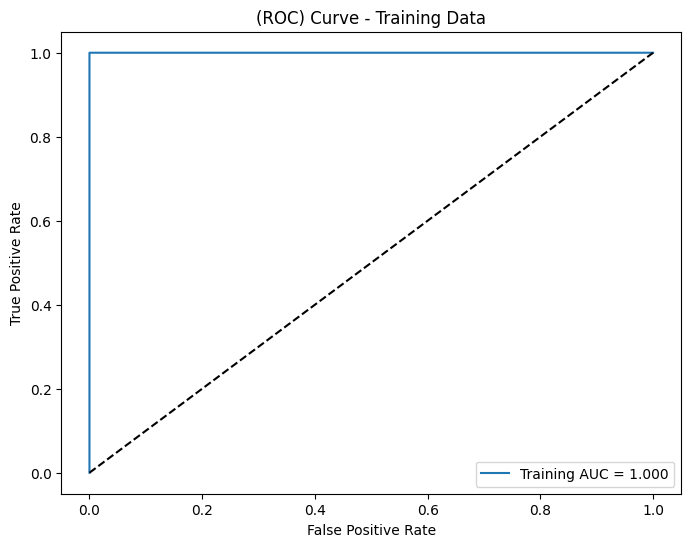

In [73]:
y_train_pred_proba = clf_xgboost_best.predict_proba(X_train_smote)[:, 1]  
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_smote_encoded, y_train_pred_proba)

auc_train = roc_auc_score(y_train_smote_encoded, y_train_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Training AUC = {auc_train:.3f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('(ROC) Curve - Training Data')
plt.legend(loc='lower right')
plt.show()

Model score for testing data: 0.9823125

Test error: 0.0177

confusion matrix for testing data 
 [[15390   235]
 [   48   327]]


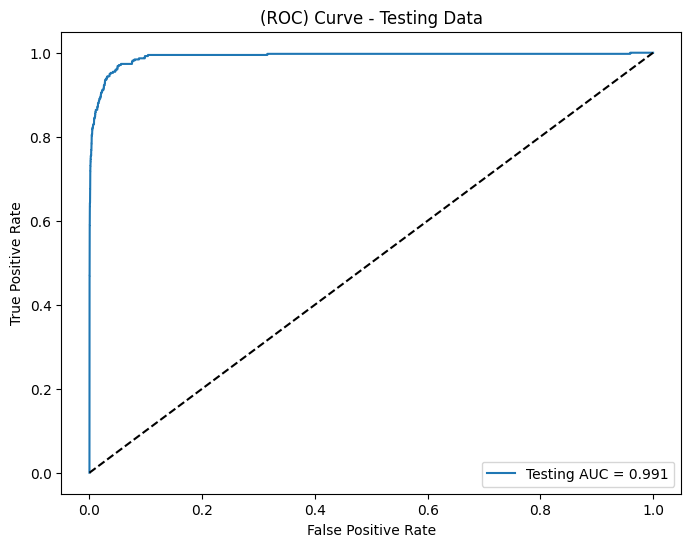

In [74]:
print(f"Model score for testing data: {clf_xgboost_best.score(X_test,y_test)}\n")
print(f"Test error: {round(1-clf_xgboost_best.score(X_test,y_test),4)}\n")
y_pred = clf_xgboost_best.predict(X_test)
c_matrix = metrics.confusion_matrix(y_test, y_pred)
print('confusion matrix for testing data \n', c_matrix)

y_test_pred_proba = clf_xgboost_best.predict_proba(X_test)[:, 1]  
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba)

auc_train = roc_auc_score(y_test, y_test_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr_test, tpr_test, label=f'Testing AUC = {auc_train:.3f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('(ROC) Curve - Testing Data')
plt.legend(loc='lower right')
plt.show()

The uncompensated case works better than with SMOTE case.

# ISLR 6.6.3

### Suppose we estimate the regression coefficients in a linear regression model by minimizing for a particular value of s. For parts (a) through (e), indicate which of i. through v. is correct. Justify your answer.

i. Increase initially, and then eventually start decreasing in an inverted U shape.  
ii. Decrease initially, and then eventually start increasing in a U shape.  
iii. Steadily increase.  
iv. Steadily decrease.  
v. Remain constant.

(a) As we increase s from 0, the training RSS will:<br>With an increase in the value of s, the estimated coefficients gradually shift from 0 towards their respective ordinary least squares (OLS) values. Therefore the training RSS will decrease steadily.

(b)Repeat (a) for test RSS.<br>
Decrease initially, and then eventually start increasing in a U shape.
Initially, the test residual sum of squares (RSS) experiences a decline until it reaches a certain level. However, beyond this point, a distinctive change occurs as the test RSS hits an inflection point. Consequently, the test residual sum error begins to rise instead of continuing its previous downward trend.

(c) Repeat (a) for variance.<br>
Steadily Increase.At the initial stage, the beta value approaches zero, indicating minimal variance. This suggests that there is little variability in the beginning. However, as the module gains flexibility, the variance gradually rises, indicating an increase in variability.

(d) Repeat (a) for (squared) bias<br>
Steadily Decrease. Due to the bias-variance trade-off, as the variance increases, the bias tends to decrease

(e) Repeat (a) for the irreducible error<br>
Remain constant. The irreducible error is inherent to any machine learning model and remains constant, independent of external factors.

# ISLR 6.6.5

### It is well-known that ridge regression tends to give similar coefficient values to correlated variables, whereas the lasso may give quite different coefficient values to correlated variables. We will now explore this property in a very simple setting.
### Suppose that n = 2, p = 2, x11 = x12, x21 = x22. Furthermore, suppose that y1+y2 =0 and x11+x21 =0 and x12+x22 =0,so that the estimate for the intercept in a least squares, ridge regression, or lasso model is zero: βˆ0 = 0.

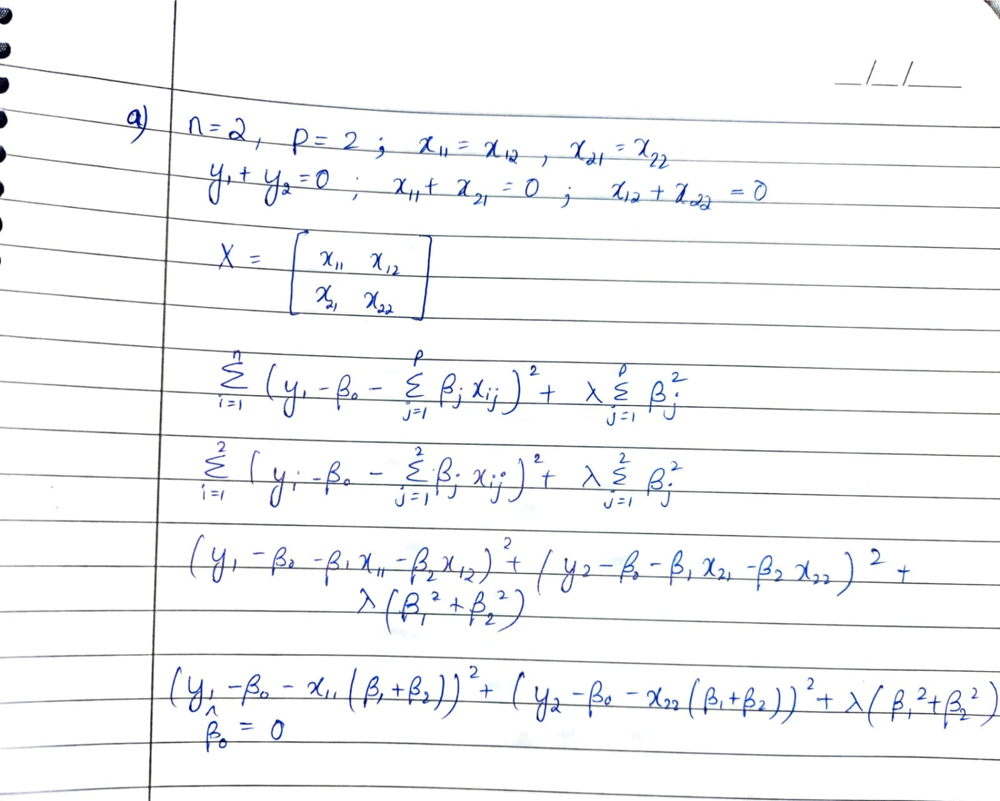

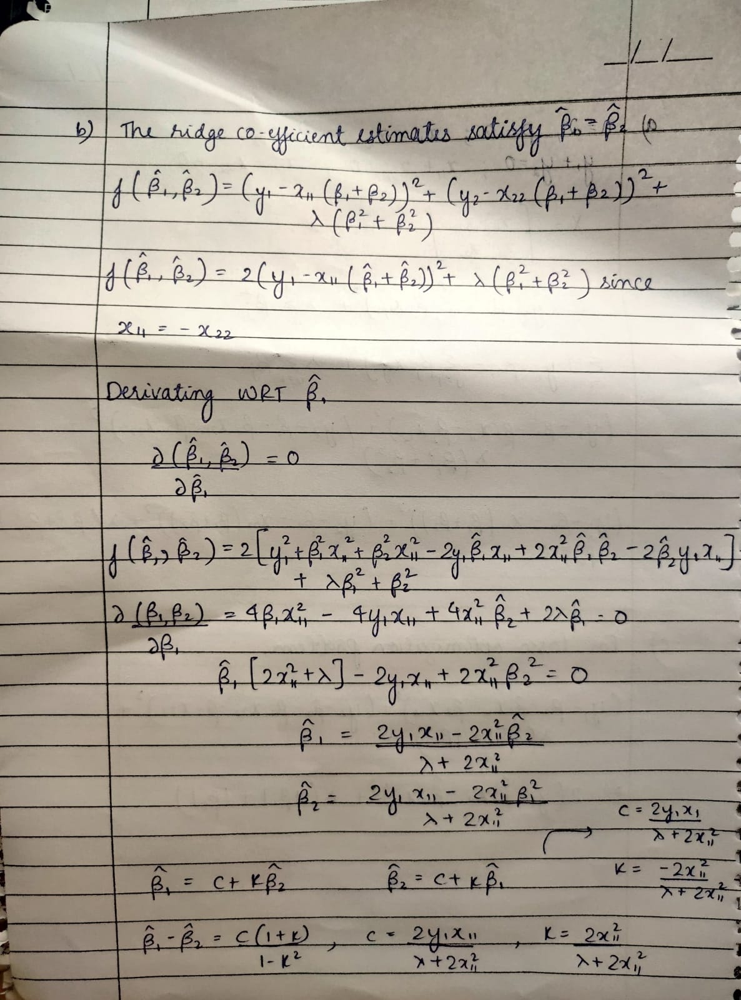

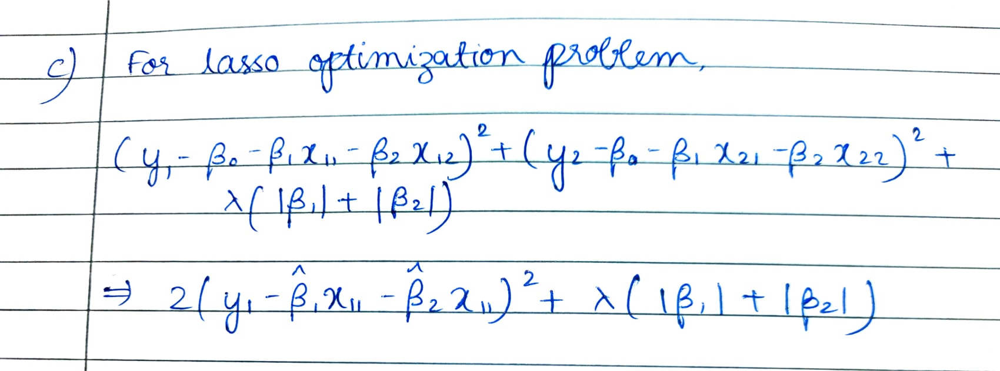

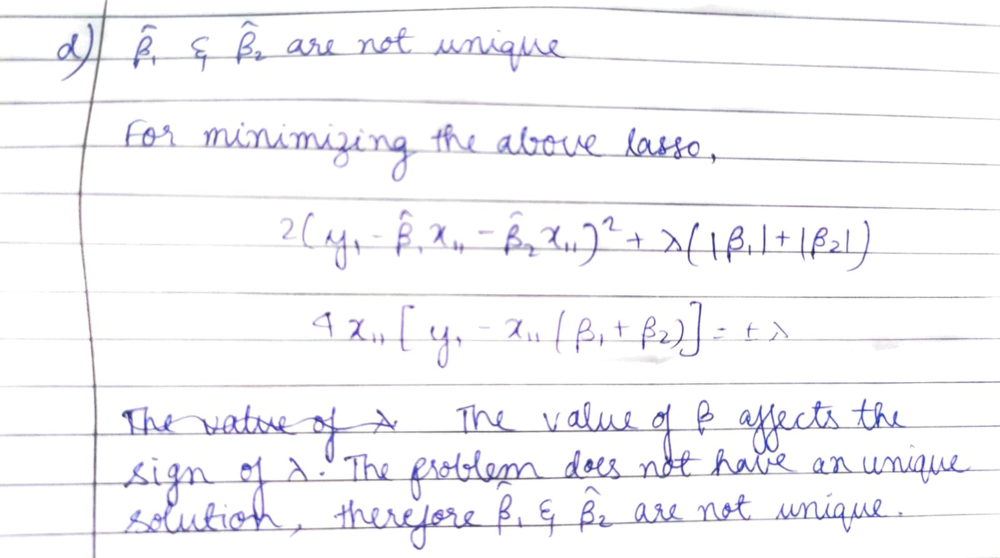

# ISLR 8.4.5

### Suppose we produce ten bootstrapped samples from a data set containing red and green classes. We then apply a classification tree to each bootstrapped sample and, for a specific value of X, produce 10 estimates of <br>P(Class is Red|X): 0.1, 0.15, 0.2, 0.2, 0.55, 0.6, 0.6, 0.65, 0.7, and 0.75.
### There are two common ways to combine these results together into a single class prediction. One is the majority vote approach discussed in this chapter. The second approach is to classify based on the average probability. In this example, what is the final classification under each of these two approaches?




Ans: Majority Polling<br>The class will be RED with more estimates greater than 0.5 considering a threshold of 0.5.

Ans: Average Probability classification<br> Average probabilities = 0.45 hence the prediction is green.


# ISLR 9.7.3

### Here we explore the maximal margin classifier on a toy data set.  <br>

In [3]:
data = {
    'x1': [3, 2, 4, 1, 2, 4, 4],
    'x2': [4,2,4,4,1,3,1],
    'y': ['red', 'red', 'red', 'red', 'blue', 'blue', 'blue']
}

df = pd.DataFrame(data)

df

,x1,x2,y
0,3,4,red
1,2,2,red
2,4,4,red
3,1,4,red
4,2,1,blue
5,4,3,blue
6,4,1,blue


(a) We are given n = 7 observations in p = 2 dimensions. For each observation, there is an associated class label. Sketch the observation

<Axes: xlabel='x1', ylabel='x2'>

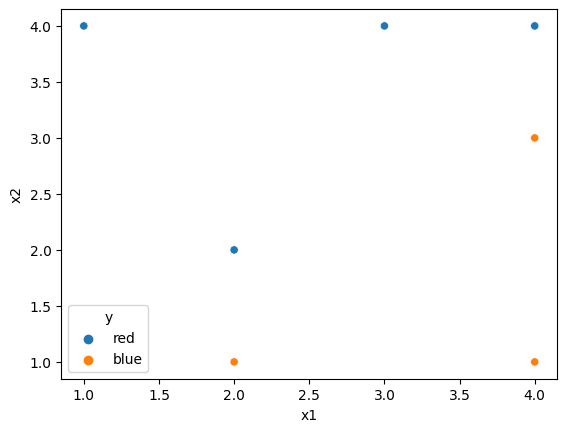

In [4]:
sns.scatterplot(data=df, x="x1", y="x2", hue="y")

(b) Sketch the optimal separating hyperplane, and provide the equation for this hyperplane (of the form (9.1)).

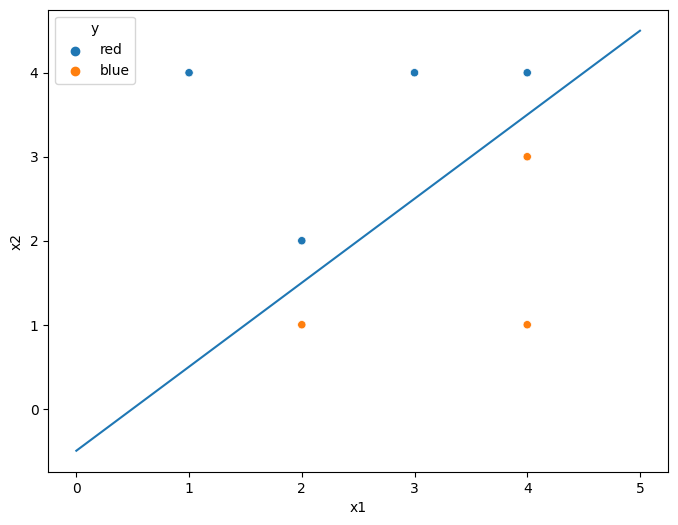

In [5]:
X1 = np.linspace(0, 5, 10)
X2 = X1 - 0.5

plt.figure(figsize=(8,6))
a = sns.scatterplot(x='x1', y='x2', hue='y', data=df)
a.plot(X1, X2)

Equation: x1 - x2 = 0.5

c) Describe the classification rule for the maximal margin classifier. It should be something along the lines of “Classify to Red if $\beta_0 + \beta_1x_1 + \beta_2x_2 > 0$, and classify to Blue otherwise.” Provide the values for $\beta_0, \beta_1, and \beta_2$.

If $\beta_0 + \beta_1x_1 + \beta_2x_2 > 0$, classify to red, otherwise blue. <br> $\beta_0 = 0.5;  \beta_1 = -1; \beta_2$ = 1

d) On your sketch, indicate the margin for the maximal margin hyperplane

The dotted lines indicates the margin for the maximal margin hyperplane


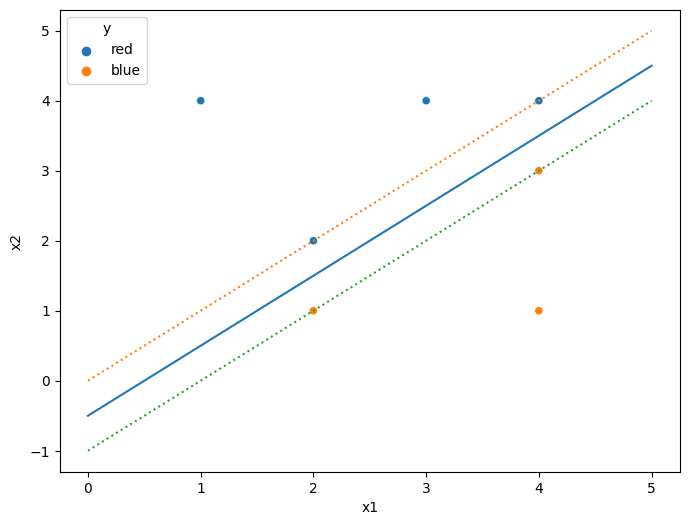

In [6]:
plt.figure(figsize=(8,6))
a = sns.scatterplot(x='x1', y='x2', hue='y', data=df)
a.plot(X1, X2)

up_mg = X1
lw_mg = X1 -1

a.plot(X1, up_mg, linestyle=':')
a.plot(X1, lw_mg, linestyle=':')
print("The dotted lines indicates the margin for the maximal margin hyperplane")

e) Indicate the support vectors for the maximal margin classifier

The points that are present on the dotted line the above diagram represent the support vectors for the maximal margin classifier. 

f) Argue that a slight movement of the seventh observation would not affect the maximal margin hyperplane

The seventh observation lies farther from the maximal margin hyperplane. Therefore, this would not affect the hyperplane. But if the seventh observation is decreased or increased by a bigger number and if it moves inside the margin for the maximal margin hyperplane, will affect the maximal margin hyperplane.

g) Sketch a hyperplane that is not the optimal separating hyperplane, and provide the equation for this hyperplane

Equation of the hyperplane: 0.5 = 0.8*X1 - X2 


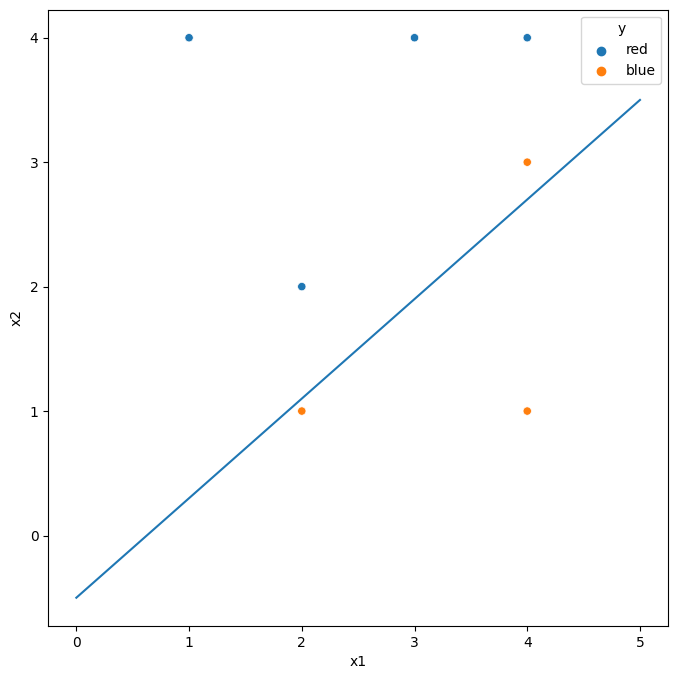

In [7]:
X1 = np.linspace(0, 5, 10)
X2 = 0.8*X1 - 0.5

plt.figure(figsize=(8,8))
a = sns.scatterplot(x='x1', y='x2', hue='y', data=df)
a.plot(X1, X2)
print("Equation of the hyperplane: 0.5 = 0.8*X1 - X2 ")

h) Draw an additional observation on the plot so that the two classes are no longer separable by a hyperplane.

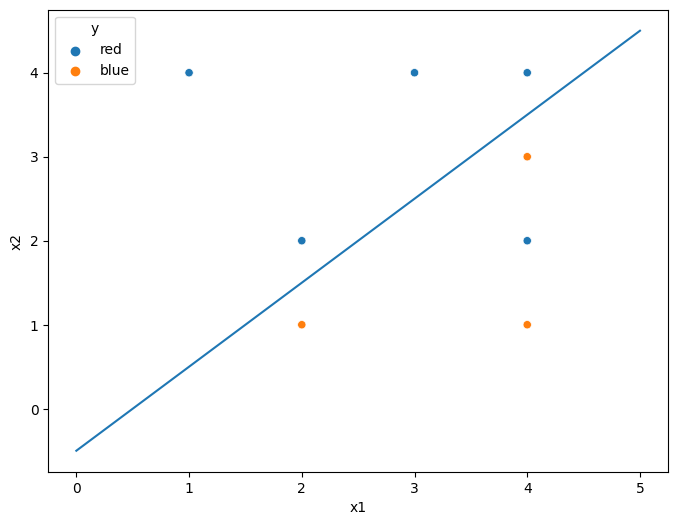

In [8]:
data = {
    'x1': [3, 2, 4, 1, 2, 4, 4,4],
    'x2': [4,2,4,4,1,3,1,2],
    'y': ['red', 'red', 'red', 'red', 'blue', 'blue', 'blue','red']
}

df = pd.DataFrame(data)

X1 = np.linspace(0, 5, 10)
X2 = X1 - 0.5

plt.figure(figsize=(8,6))
a = sns.scatterplot(x='x1', y='x2', hue='y', data=df)
a.plot(X1, X2)

The (4,2) that belongs to blue is an additional observation on the plot so that the two classes are no longer separable by a hyperplane.

### References

* https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/
* https://machinelearningmastery.com/bagging-and-random-forest-for-imbalanced-classification/

In [2]:

Cs = np.logspace(-2.3, -1.3, 10)

In [3]:
Cs

array([0.00501187, 0.00647308, 0.00836031, 0.01079775, 0.01394583,
       0.01801174, 0.02326305, 0.03004539, 0.03880511, 0.05011872])

/var/folders/9m/l4vpyk997b9fh8g5ldcg6gwr0000gn/T/ipykernel_11330/202710664.py:9: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dissimilarity_matrix, method='complete')


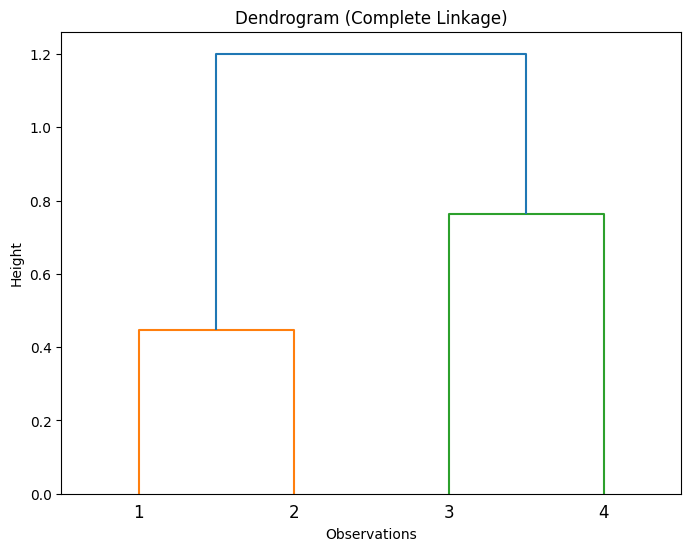

In [6]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Dissimilarity matrix
dissimilarity_matrix = np.array([[0.0, 0.3, 0.4, 0.7], [0.3, 0.0, 0.5, 0.8], [0.4, 0.5, 0.0, 0.45], [0.7, 0.8, 0.45, 0.0]])

Z = linkage(dissimilarity_matrix, method='complete')

# Plotting the dendrogram
plt.figure(figsize=(8, 6))
dendrogram(Z, labels=['1', '2', '3', '4'], leaf_font_size=12)
plt.xlabel('Observations')
plt.ylabel('Height')
plt.title('Dendrogram (Complete Linkage)')
plt.show()

/var/folders/9m/l4vpyk997b9fh8g5ldcg6gwr0000gn/T/ipykernel_11330/236541771.py:12: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dissimilarity_matrix, method='single')


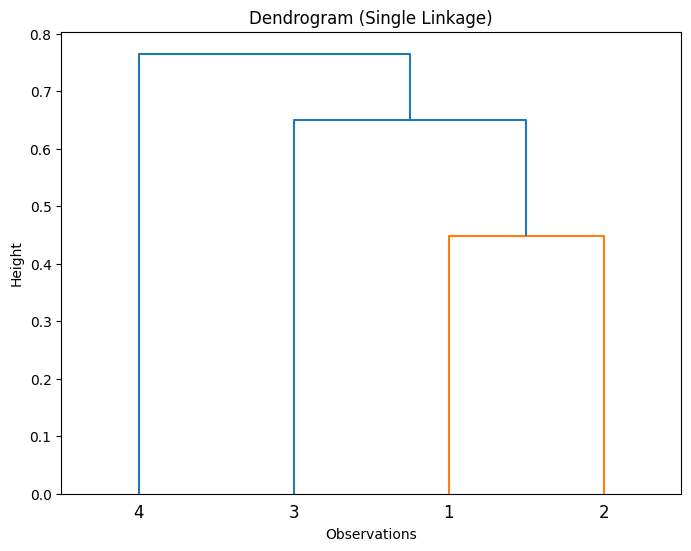

In [7]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

dissimilarity_matrix = np.array([[0.0, 0.3, 0.4, 0.7],
                                 [0.3, 0.0, 0.5, 0.8],
                                 [0.4, 0.5, 0.0, 0.45],
                                 [0.7, 0.8, 0.45, 0.0]])
Z = linkage(dissimilarity_matrix, method='single')
plt.figure(figsize=(8, 6))
dendrogram(Z, labels=['1', '2', '3', '4'], leaf_font_size=12)
plt.xlabel('Observations')
plt.ylabel('Height')
plt.title('Dendrogram (Single Linkage)')
plt.show()
